In [1]:
# Import necessary libraries
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from datetime import datetime
import warnings
# Suppress all warnings including FutureWarnings
warnings.filterwarnings('ignore', category=FutureWarning)
warnings.filterwarnings('ignore', category=UserWarning)
warnings.filterwarnings('ignore')

# Time series libraries
from statsmodels.tsa.arima.model import ARIMA
from statsmodels.tsa.holtwinters import ExponentialSmoothing
from statsmodels.tsa.seasonal import seasonal_decompose, STL
from statsmodels.tsa.stattools import adfuller
from sklearn.metrics import mean_squared_error, mean_absolute_error

# For downloading real data from Yahoo Finance
import yfinance as yf

# Prophet (Facebook's forecasting tool)
from prophet import Prophet

# TBATS model
from tbats import TBATS

# BSTS-like model (using statsmodels UnobservedComponents)
from statsmodels.tsa.statespace.structural import UnobservedComponents

# Set style for better-looking plots
plt.style.use('seaborn-v0_8-darkgrid')
sns.set_palette("husl")

# Set random seed for reproducibility
np.random.seed(42)

Importing plotly failed. Interactive plots will not work.


In [2]:
# Load S&P 500 Stock Market Index data (same as Lesson 4)
print("Loading S&P 500 Stock Market Index data...")
print("=" * 60)

print("\nDownloading S&P 500 daily closing prices from Yahoo Finance...")

# Download S&P 500 data - get last 5+ years of daily data
ticker = "^GSPC"  # S&P 500 index symbol
sp500 = yf.download(ticker, start='2019-01-01', end=None, progress=False)

# Handle MultiIndex columns if present
if isinstance(sp500.columns, pd.MultiIndex):
    sp500.columns = sp500.columns.droplevel(1)

# Extract closing prices
close_prices = sp500['Close'].dropna()

# Create DataFrame with proper index
dates = close_prices.index
df = pd.DataFrame({
    'price': close_prices.values,
    'day_of_week': dates.dayofweek,
    'month': dates.month,
    'is_weekend': (dates.dayofweek >= 5).astype(int)
}, index=dates)

print(f"✓ Successfully loaded S&P 500 Stock Market Data!")
print(f"  Date range: {df.index.min()} to {df.index.max()}")
print(f"  Number of observations: {len(df)}")
print(f"  Index range: {df['price'].min():.2f} to {df['price'].max():.2f}")
print(f"  Units: Index value (closing price)")

# Display first few rows
print("\n" + "=" * 60)
print("First 5 rows:")
print(df.head())

Loading S&P 500 Stock Market Index data...

✓ Successfully loaded S&P 500 Stock Market Data!
  Date range: 2019-01-02 00:00:00 to 2026-01-30 00:00:00
  Number of observations: 1780
  Index range: 2237.40 to 6978.60
  Units: Index value (closing price)

First 5 rows:
                  price  day_of_week  month  is_weekend
Date                                                   
2019-01-02  2510.030029            2      1           0
2019-01-03  2447.889893            3      1           0
2019-01-04  2531.939941            4      1           0
2019-01-07  2549.689941            0      1           0
2019-01-08  2574.409912            1      1           0


## Part 2: Frequency Considerations in Forecasting

The sampling frequency of a time series fundamentally constrains which models are appropriate and which assumptions are reasonable.

**Key insights:**
- **Low frequency** (annual, quarterly): Structural interpretation easier, but short series
- **High frequency** (daily, hourly): Richer dynamics, multiple seasonalities, but more noise
- **Aggregation trade-offs**: Reduces noise but discards information

Let's demonstrate by aggregating our daily data to weekly and monthly frequencies:

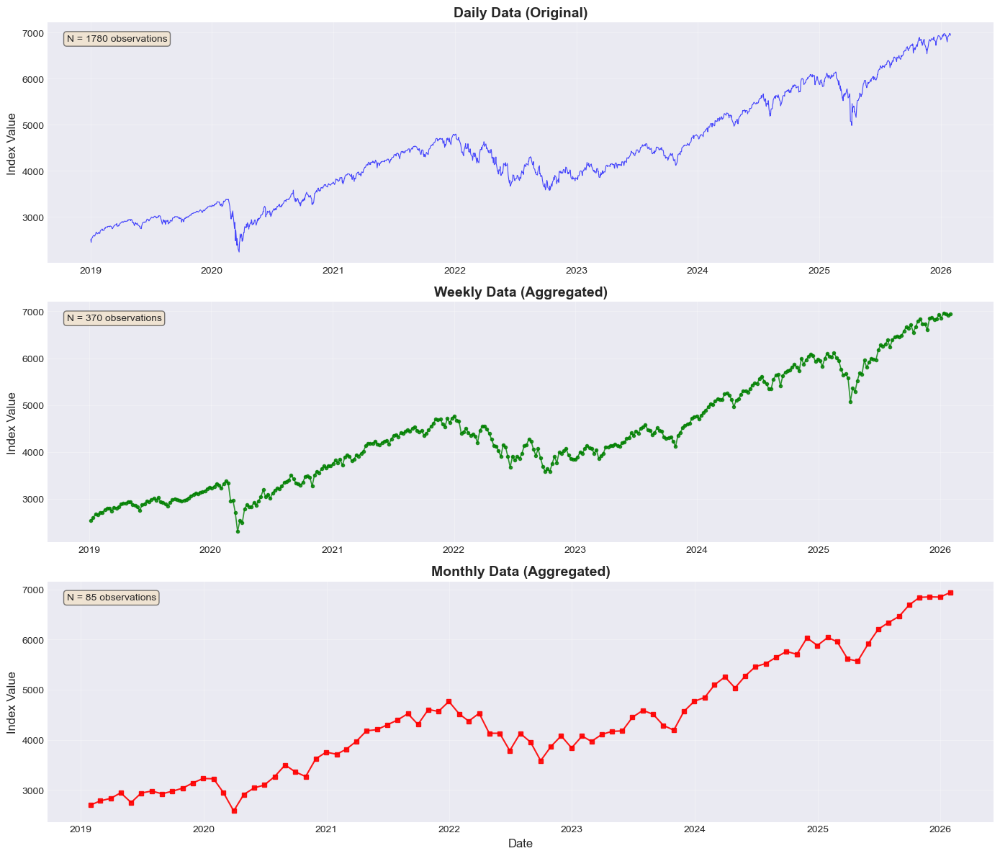


Frequency Comparison:
Daily:    1780 observations, Std Dev:    1145.18
Weekly:    370 observations, Std Dev:    1148.09
Monthly:    85 observations, Std Dev:    1165.92

Note: Aggregation reduces noise (lower std dev) but also reduces sample size.


In [3]:
# Create aggregated versions of the data
df_weekly = df['price'].resample('W').last()  # Weekly (last value of week)
df_monthly = df['price'].resample('M').last()  # Monthly (last value of month)

# Visualize different frequencies
fig, axes = plt.subplots(3, 1, figsize=(14, 12))

# Daily data
axes[0].plot(df.index, df['price'], linewidth=0.8, alpha=0.7, color='blue')
axes[0].set_title('Daily Data (Original)', fontsize=14, fontweight='bold')
axes[0].set_ylabel('Index Value', fontsize=12)
axes[0].grid(True, alpha=0.3)
axes[0].text(0.02, 0.95, f'N = {len(df)} observations', transform=axes[0].transAxes,
             fontsize=10, verticalalignment='top', bbox=dict(boxstyle='round', facecolor='wheat', alpha=0.5))

# Weekly data
axes[1].plot(df_weekly.index, df_weekly.values, linewidth=1.2, alpha=0.8, color='green', marker='o', markersize=3)
axes[1].set_title('Weekly Data (Aggregated)', fontsize=14, fontweight='bold')
axes[1].set_ylabel('Index Value', fontsize=12)
axes[1].grid(True, alpha=0.3)
axes[1].text(0.02, 0.95, f'N = {len(df_weekly)} observations', transform=axes[1].transAxes,
             fontsize=10, verticalalignment='top', bbox=dict(boxstyle='round', facecolor='wheat', alpha=0.5))

# Monthly data
axes[2].plot(df_monthly.index, df_monthly.values, linewidth=1.5, alpha=0.9, color='red', marker='s', markersize=4)
axes[2].set_title('Monthly Data (Aggregated)', fontsize=14, fontweight='bold')
axes[2].set_ylabel('Index Value', fontsize=12)
axes[2].set_xlabel('Date', fontsize=12)
axes[2].grid(True, alpha=0.3)
axes[2].text(0.02, 0.95, f'N = {len(df_monthly)} observations', transform=axes[2].transAxes,
             fontsize=10, verticalalignment='top', bbox=dict(boxstyle='round', facecolor='wheat', alpha=0.5))

plt.tight_layout()
plt.show()

print("\n" + "=" * 60)
print("Frequency Comparison:")
print("=" * 60)
print(f"Daily:   {len(df):>5} observations, Std Dev: {df['price'].std():>10.2f}")
print(f"Weekly:  {len(df_weekly):>5} observations, Std Dev: {df_weekly.std():>10.2f}")
print(f"Monthly: {len(df_monthly):>5} observations, Std Dev: {df_monthly.std():>10.2f}")
print("\nNote: Aggregation reduces noise (lower std dev) but also reduces sample size.")

## Part 3: Forecasting with Constraints

Many real forecasting problems require predictions to satisfy **hard constraints**:
- **Non-negativity**: Sales, demand, counts
- **Upper bounds**: Capacity, market share
- **Logical consistency**: Components sum correctly

**Key principle**: Constraints should be enforced inside the model, not after forecasting.

### Transformations as a Modeling Tool

A principled way to enforce constraints is via **transformations**:
- **Log transform**: Enforces non-negativity, stabilizes variance
- **Box-Cox transform**: General power transformation
- **Logit transform**: For bounded outcomes (0-1)

Let's demonstrate with log transformation:

In [4]:
# Train/test split: Test on last 1 year (from 2025-01-31 to end)
split_date = pd.Timestamp('2025-01-31')
train = df[df.index < split_date].copy()
test = df[df.index >= split_date].copy()

print(f"Training set: {train.index.min()} to {train.index.max()} ({len(train)} observations)")
print(f"Test set: {test.index.min()} to {test.index.max()} ({len(test)} observations)")
print(f"\nTest set represents {len(test)/len(df)*100:.1f}% of total data")
print(f"Test period: Last 1 year (from {split_date.date()})")

Training set: 2019-01-02 00:00:00 to 2025-01-30 00:00:00 (1529 observations)
Test set: 2025-01-31 00:00:00 to 2026-01-30 00:00:00 (251 observations)

Test set represents 14.1% of total data
Test period: Last 1 year (from 2025-01-31)


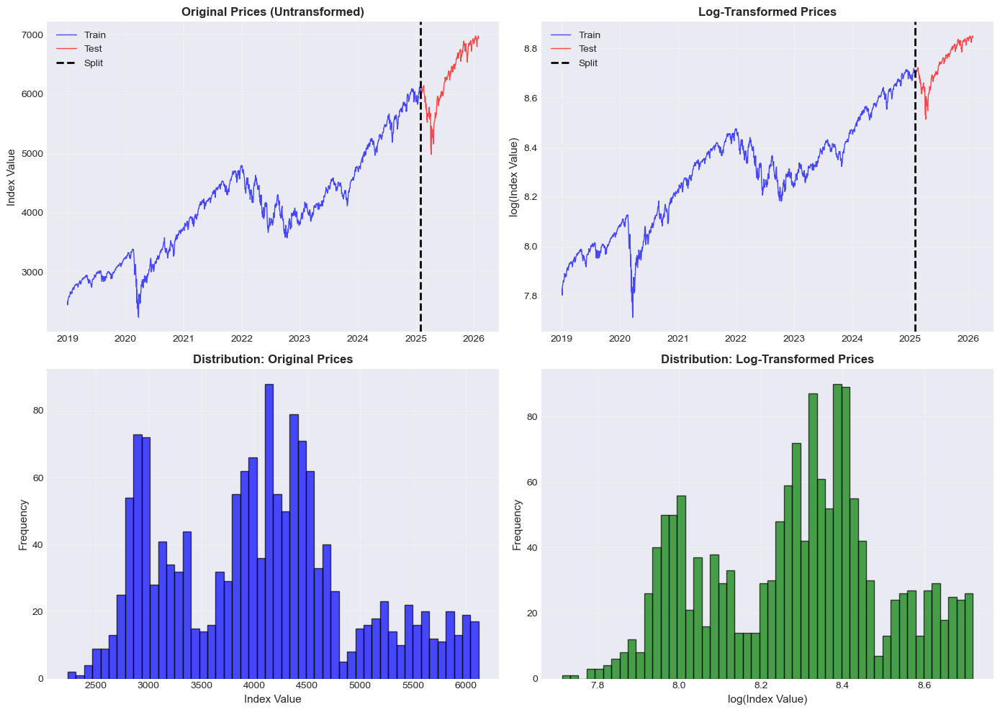


Variance Comparison (Training Data):
Original prices:     Variance =    783653.22, Std Dev =     885.24
Log-transformed:     Variance =     0.048519, Std Dev =   0.220270

Log transformation stabilizes variance (coefficient of variation is more constant).


In [5]:
# Demonstrate log transformation
train['price_log'] = np.log(train['price'])
test['price_log'] = np.log(test['price'])

# Visualize original vs log-transformed
fig, axes = plt.subplots(2, 2, figsize=(14, 10))

# Original prices
axes[0, 0].plot(train.index, train['price'], linewidth=1, alpha=0.7, color='blue', label='Train')
axes[0, 0].plot(test.index, test['price'], linewidth=1, alpha=0.7, color='red', label='Test')
axes[0, 0].axvline(x=split_date, color='black', linestyle='--', linewidth=2, label='Split')
axes[0, 0].set_title('Original Prices (Untransformed)', fontsize=12, fontweight='bold')
axes[0, 0].set_ylabel('Index Value', fontsize=11)
axes[0, 0].legend()
axes[0, 0].grid(True, alpha=0.3)

# Log-transformed prices
axes[0, 1].plot(train.index, train['price_log'], linewidth=1, alpha=0.7, color='blue', label='Train')
axes[0, 1].plot(test.index, test['price_log'], linewidth=1, alpha=0.7, color='red', label='Test')
axes[0, 1].axvline(x=split_date, color='black', linestyle='--', linewidth=2, label='Split')
axes[0, 1].set_title('Log-Transformed Prices', fontsize=12, fontweight='bold')
axes[0, 1].set_ylabel('log(Index Value)', fontsize=11)
axes[0, 1].legend()
axes[0, 1].grid(True, alpha=0.3)

# Distribution comparison
axes[1, 0].hist(train['price'], bins=50, alpha=0.7, color='blue', edgecolor='black')
axes[1, 0].set_title('Distribution: Original Prices', fontsize=12, fontweight='bold')
axes[1, 0].set_xlabel('Index Value', fontsize=11)
axes[1, 0].set_ylabel('Frequency', fontsize=11)
axes[1, 0].grid(True, alpha=0.3)

axes[1, 1].hist(train['price_log'], bins=50, alpha=0.7, color='green', edgecolor='black')
axes[1, 1].set_title('Distribution: Log-Transformed Prices', fontsize=12, fontweight='bold')
axes[1, 1].set_xlabel('log(Index Value)', fontsize=11)
axes[1, 1].set_ylabel('Frequency', fontsize=11)
axes[1, 1].grid(True, alpha=0.3)

plt.tight_layout()
plt.show()

# Compare variance
print("\n" + "=" * 60)
print("Variance Comparison (Training Data):")
print("=" * 60)
print(f"Original prices:     Variance = {train['price'].var():>12.2f}, Std Dev = {train['price'].std():>10.2f}")
print(f"Log-transformed:     Variance = {train['price_log'].var():>12.6f}, Std Dev = {train['price_log'].std():>10.6f}")
print(f"\nLog transformation stabilizes variance (coefficient of variation is more constant).")

## Part 4: TBATS Model

**TBATS** (Trigonometric Box-Cox ARIMA Time Series) is designed for time series with:
- Multiple seasonalities (daily, weekly, yearly)
- Complex seasonal patterns
- Non-integer seasonality periods

TBATS uses:
- Trigonometric terms for seasonality
- Box-Cox transformation for variance stabilization
- ARIMA errors
- State space framework

Let's fit a TBATS model:

In [6]:
# Import TBATS
from tbats import TBATS

# Fit TBATS model
print("Fitting TBATS model...")
print("=" * 60)

# TBATS expects numpy array
# TBATS will handle Box-Cox transformation internally (includes log as special case)
train_values = train['price'].values

# Fit TBATS
# Note: For daily stock data, we don't include yearly seasonality as it's not very relevant
# and would make fitting very slow. TBATS can handle multiple seasonalities if needed.
# We use use_trend=True to allow TBATS to capture trends in the data
print("Fitting TBATS model (this may take a moment)...")
print("=" * 60)

tbats_model = TBATS(
    seasonal_periods=None,  # No seasonal component for daily stock data
    use_arma_errors=True,
    use_trend=True,  # Allow trend component
    use_box_cox=True  # Set to True if you want Box-Cox transformation
)

tbats_fitted = tbats_model.fit(train_values)



# Forecast - TBATS handles Box-Cox transformation and back-transformation automatically
tbats_forecast = tbats_fitted.forecast(steps=len(test))

print("✓ TBATS model fitted successfully!")
print(f"  AIC: {tbats_fitted.aic:.2f}")

Fitting TBATS model...
Fitting TBATS model (this may take a moment)...


/opt/miniconda3/lib/python3.13/site-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/opt/miniconda3/lib/python3.13/site-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/opt/miniconda3/lib/python3.13/site-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/opt/miniconda3/lib/python3.13/site-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/opt/miniconda3/lib/python3.13/site-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


✓ TBATS model fitted successfully!
  AIC: 22893.55


/opt/miniconda3/lib/python3.13/site-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/opt/miniconda3/lib/python3.13/site-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/opt/miniconda3/lib/python3.13/site-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/opt/miniconda3/lib/python3.13/site-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/opt/miniconda3/lib/python3.13/site-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


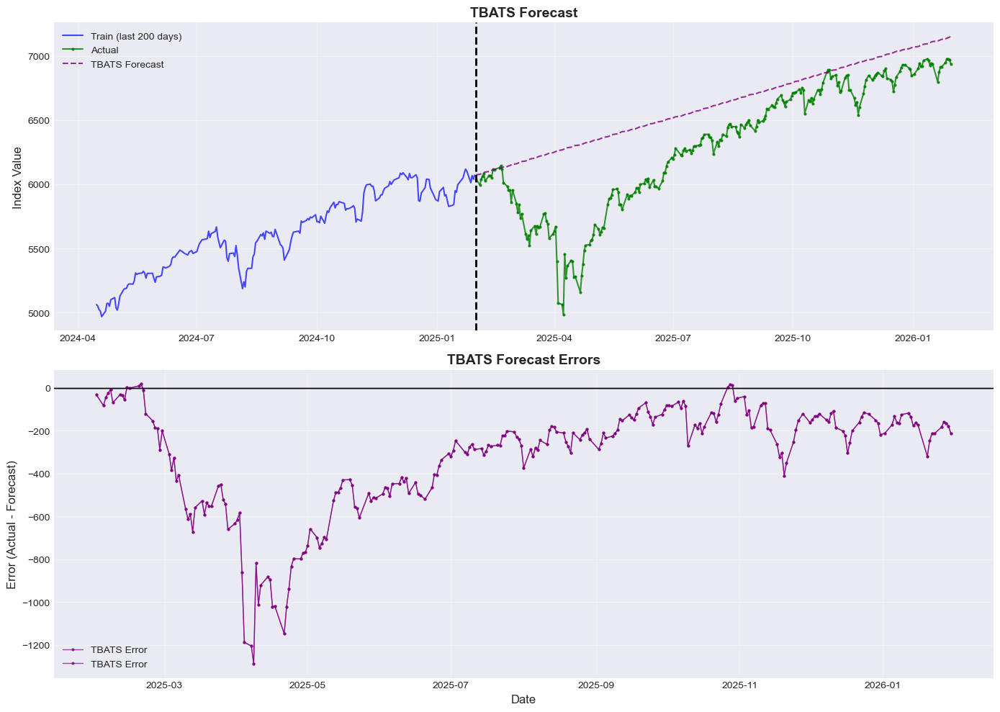


TBATS Forecast Performance:
MAE:  321.27
RMSE: 409.10

TBATS advantages:
  - Handles multiple seasonalities
  - Works with non-integer seasonal periods
  - Automatic model selection


In [7]:
# Visualize TBATS forecast
fig, axes = plt.subplots(2, 1, figsize=(14, 10))

# Plot 1: Forecast
axes[0].plot(train.index[-200:], train['price'][-200:], linewidth=1.5, alpha=0.7, 
            color='blue', label='Train (last 200 days)')
axes[0].plot(test.index, test['price'], linewidth=1.5, alpha=0.8, 
            color='green', label='Actual', marker='o', markersize=2)
axes[0].plot(test.index, tbats_forecast, linewidth=1.5, alpha=0.8, 
            color='purple', linestyle='--', label='TBATS Forecast')
axes[0].axvline(x=split_date, color='black', linestyle='--', linewidth=2)
axes[0].set_title('TBATS Forecast', fontsize=14, fontweight='bold')
axes[0].set_ylabel('Index Value', fontsize=12)
axes[0].legend()
axes[0].grid(True, alpha=0.3)

# Plot 2: Forecast errors
tbats_errors = test['price'].values - tbats_forecast
axes[1].plot(test.index, tbats_errors, linewidth=1, alpha=0.7, 
            color='purple', label='TBATS Error', marker='o', markersize=2)
axes[1].axhline(y=0, color='black', linestyle='-', linewidth=1)
axes[1].set_title('TBATS Forecast Errors', fontsize=14, fontweight='bold')
axes[1].set_xlabel('Date', fontsize=12)
axes[1].set_ylabel('Error (Actual - Forecast)', fontsize=12)
axes[1].legend()
axes[1].grid(True, alpha=0.3)
axes[1].plot(test.index, tbats_errors, linewidth=1, alpha=0.7, 
            color='purple', label='TBATS Error', marker='o', markersize=2)
axes[1].axhline(y=0, color='black', linestyle='-', linewidth=1)
axes[1].set_title('TBATS Forecast Errors', fontsize=14, fontweight='bold')
axes[1].set_xlabel('Date', fontsize=12)
axes[1].set_ylabel('Error (Actual - Forecast)', fontsize=12)
axes[1].legend()
axes[1].grid(True, alpha=0.3)

plt.tight_layout()
plt.show()

# Calculate metrics
tbats_mae = mean_absolute_error(test['price'], tbats_forecast)
tbats_rmse = np.sqrt(mean_squared_error(test['price'], tbats_forecast))

print("\n" + "=" * 60)
print("TBATS Forecast Performance:")
print("=" * 60)
print(f"MAE:  {tbats_mae:.2f}")
print(f"RMSE: {tbats_rmse:.2f}")
print(f"\nTBATS advantages:")
print(f"  - Handles multiple seasonalities")
print(f"  - Works with non-integer seasonal periods")
print(f"  - Automatic model selection")

## Part 5: BSTS (Bayesian Structural Time Series)

**BSTS** (Bayesian Structural Time Series) is a flexible framework for:
- Time-varying regression coefficients
- Explicit intervention modeling
- Model averaging via spike-and-slab priors
- Full posterior uncertainty


In [9]:
# Use statsmodels UnobservedComponents (similar to BSTS)
from statsmodels.tsa.statespace.structural import UnobservedComponents

# Fit BSTS-like model using UnobservedComponents
print("Fitting BSTS-like model (UnobservedComponents)...")
print("=" * 60)

# Use a regression-based approach: linear trend with deterministic level
# This is essentially: y(t) = intercept + slope*t + error
# trend='linear' creates a deterministic linear trend model
bsts_model = UnobservedComponents(
    train['price'],
    level='dconstant',  # Deterministic constant level (intercept) - valid option
    trend='linear',     # Deterministic linear trend (slope)
    seasonal=None,      # No seasonal component for daily data
    irregular=True     # Irregular component (error)
)

# Fit with more iterations and check convergence
bsts_fitted = bsts_model.fit(method='lbfgs', maxiter=2000, disp=0)

bsts_forecast = bsts_fitted.forecast(steps=len(test))
bsts_forecast_ci = bsts_fitted.get_forecast(steps=len(test)).conf_int()

print("✓ BSTS-like model fitted successfully!")
print(f"  AIC: {bsts_fitted.aic:.2f}")
print(f"  BIC: {bsts_fitted.bic:.2f}")



Fitting BSTS-like model (UnobservedComponents)...
✓ BSTS-like model fitted successfully!
  AIC: 25095.57
  BIC: 25100.90


/opt/miniconda3/lib/python3.13/site-packages/statsmodels/tsa/statespace/structural.py:426: SpecificationWarning: Value of `irregular` may be overridden when the trend component is specified using a model string.
  warn("Value of `%s` may be overridden when the trend"
/opt/miniconda3/lib/python3.13/site-packages/statsmodels/tsa/statespace/structural.py:426: SpecificationWarning: Value of `trend` may be overridden when the trend component is specified using a model string.
  warn("Value of `%s` may be overridden when the trend"
/opt/miniconda3/lib/python3.13/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/opt/miniconda3/lib/python3.13/site-packages/statsmodels/tsa/base/tsa_model.py:837: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  ret

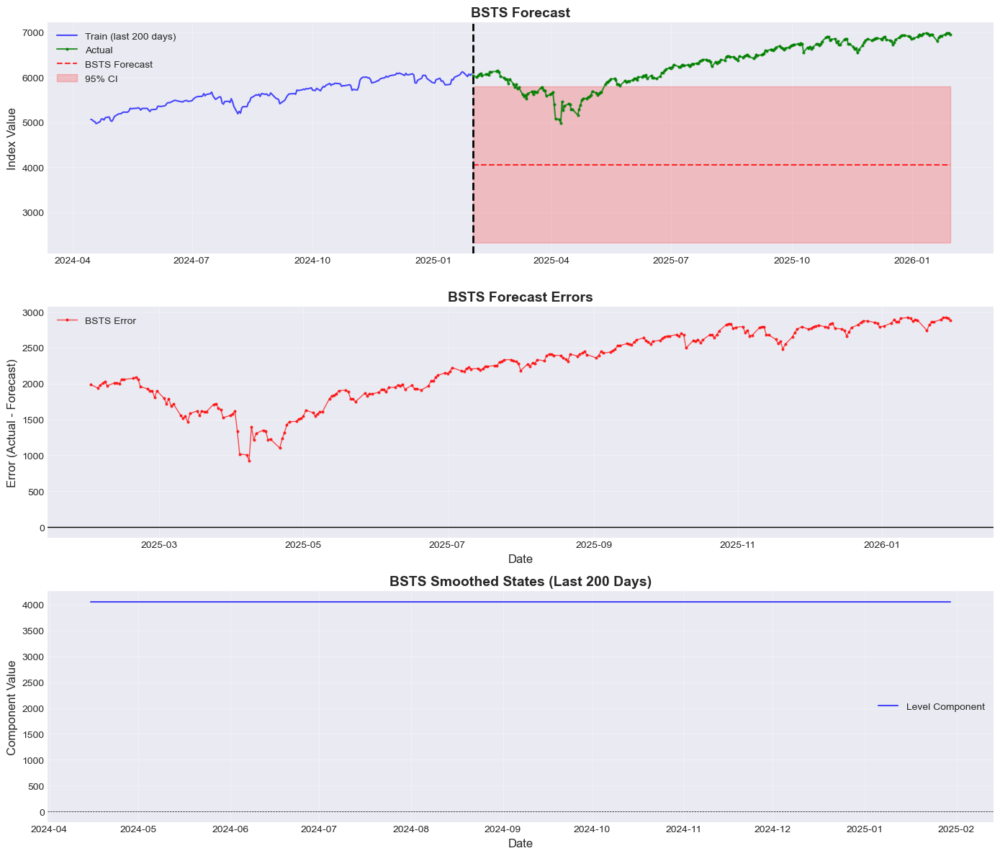


BSTS Forecast Performance:
MAE:  2234.84
RMSE: 2288.36

BSTS advantages:
  - Fully probabilistic (posterior uncertainty)
  - Modular components (trend, seasonality, regression)
  - Can handle interventions and structural breaks
  - Model averaging capabilities


In [10]:
# Visualize BSTS forecast and components
fig, axes = plt.subplots(3, 1, figsize=(14, 12))

# Plot 1: Full forecast with components
axes[0].plot(train.index[-200:], train['price'][-200:], linewidth=1.5, alpha=0.7, 
            color='blue', label='Train (last 200 days)')
axes[0].plot(test.index, test['price'], linewidth=1.5, alpha=0.8, 
            color='green', label='Actual', marker='o', markersize=2)
# Handle both pandas Series and numpy array for plotting
bsts_forecast_plot = bsts_forecast.values if hasattr(bsts_forecast, 'values') else bsts_forecast
axes[0].plot(test.index, bsts_forecast_plot, linewidth=1.5, alpha=0.8, 
            color='red', linestyle='--', label='BSTS Forecast')
# Handle CI - could be DataFrame or array
if hasattr(bsts_forecast_ci, 'iloc'):
    axes[0].fill_between(test.index, 
                         bsts_forecast_ci.iloc[:, 0], 
                         bsts_forecast_ci.iloc[:, 1], 
                         alpha=0.2, color='red', label='95% CI')
else:
    # If CI is array, assume it's shape (n, 2)
    axes[0].fill_between(test.index, 
                         bsts_forecast_ci[:, 0], 
                         bsts_forecast_ci[:, 1], 
                         alpha=0.2, color='red', label='95% CI')
axes[0].axvline(x=split_date, color='black', linestyle='--', linewidth=2)
axes[0].set_title('BSTS Forecast', fontsize=14, fontweight='bold')
axes[0].set_ylabel('Index Value', fontsize=12)
axes[0].legend()
axes[0].grid(True, alpha=0.3)

# Plot 2: Forecast errors
# Handle both pandas Series and numpy array
bsts_forecast_array = bsts_forecast.values if hasattr(bsts_forecast, 'values') else bsts_forecast
bsts_errors = test['price'].values - bsts_forecast_array
axes[1].plot(test.index, bsts_errors, linewidth=1, alpha=0.7, 
            color='red', label='BSTS Error', marker='o', markersize=2)
axes[1].axhline(y=0, color='black', linestyle='-', linewidth=1)
axes[1].set_title('BSTS Forecast Errors', fontsize=14, fontweight='bold')
axes[1].set_xlabel('Date', fontsize=12)
axes[1].set_ylabel('Error (Actual - Forecast)', fontsize=12)
axes[1].legend()
axes[1].grid(True, alpha=0.3)

# Plot 3: Smoothed states (level and trend components)
smoothed_states = bsts_fitted.smoothed_state
if smoothed_states.shape[0] >= 1:
    axes[2].plot(train.index[-200:], smoothed_states[0, -200:], 
                linewidth=1.5, alpha=0.7, color='blue', label='Level Component')
    if smoothed_states.shape[0] >= 2:
        # Scale trend for visibility
        trend_scaled = smoothed_states[1, -200:] * 10  # Scale by 10 for visibility
        axes[2].plot(train.index[-200:], trend_scaled, 
                    linewidth=1.5, alpha=0.7, color='orange', label='Trend Component (scaled x10)')
    axes[2].set_title('BSTS Smoothed States (Last 200 Days)', fontsize=14, fontweight='bold')
    axes[2].set_xlabel('Date', fontsize=12)
    axes[2].set_ylabel('Component Value', fontsize=12)
    axes[2].legend()
    axes[2].grid(True, alpha=0.3)
    axes[2].axhline(y=0, color='black', linestyle='--', linewidth=0.5)

plt.tight_layout()
plt.show()

# Calculate metrics - ensure bsts_forecast is numpy array
bsts_forecast_metrics = bsts_forecast.values if hasattr(bsts_forecast, 'values') else bsts_forecast
bsts_mae = mean_absolute_error(test['price'], bsts_forecast_metrics)
bsts_rmse = np.sqrt(mean_squared_error(test['price'], bsts_forecast_metrics))

print("\n" + "=" * 60)
print("BSTS Forecast Performance:")
print("=" * 60)
print(f"MAE:  {bsts_mae:.2f}")
print(f"RMSE: {bsts_rmse:.2f}")
print(f"\nBSTS advantages:")
print(f"  - Fully probabilistic (posterior uncertainty)")
print(f"  - Modular components (trend, seasonality, regression)")
print(f"  - Can handle interventions and structural breaks")
print(f"  - Model averaging capabilities")

## Part 6: Prophet - Facebook's Forecasting Tool

**Prophet** is designed for business forecasting with:
- Automatic changepoint detection
- Multiple seasonalities (daily, weekly, yearly)
- Holiday effects
- Robustness to missing data and outliers

In [11]:
# Prepare data for Prophet (requires 'ds' and 'y' columns)
prophet_train = pd.DataFrame({
    'ds': train.index,
    'y': train['price'].values
})

# Initialize and fit Prophet model
print("Fitting Prophet model...")
prophet_model = Prophet(
    yearly_seasonality=True,  # Yearly seasonality
    weekly_seasonality=False,  # Weekly (not relevant for daily stock data)
    daily_seasonality=False,   # Daily (not relevant)
    changepoint_prior_scale=0.05,  # Controls flexibility of trend changes
    seasonality_prior_scale=10.0   # Controls strength of seasonality
)

prophet_model.fit(prophet_train)

# Make future dataframe for forecasting
future = prophet_model.make_future_dataframe(periods=len(test), freq='D')

# Forecast
forecast = prophet_model.predict(future)

# Extract forecast for test period
# Prophet generates forecasts for all dates (including weekends/holidays)
# We need to align with test data which only has business days
forecast.set_index('ds', inplace=True)
# Reindex to match test.index (business days only)
forecast_test = forecast.reindex(test.index).copy()
# Drop any rows that couldn't be matched (shouldn't happen, but just in case)
forecast_test = forecast_test.dropna()

print("✓ Prophet model fitted successfully!")
print(f"  Forecast period: {forecast_test.index.min()} to {forecast_test.index.max()}")
print(f"  Forecast aligned to test data: {len(forecast_test)} business days (excluding weekends/holidays)")

14:30:55 - cmdstanpy - INFO - Chain [1] start processing


Fitting Prophet model...


14:30:56 - cmdstanpy - INFO - Chain [1] done processing


✓ Prophet model fitted successfully!
  Forecast period: 2025-01-31 00:00:00 to 2025-10-08 00:00:00
  Forecast aligned to test data: 173 business days (excluding weekends/holidays)


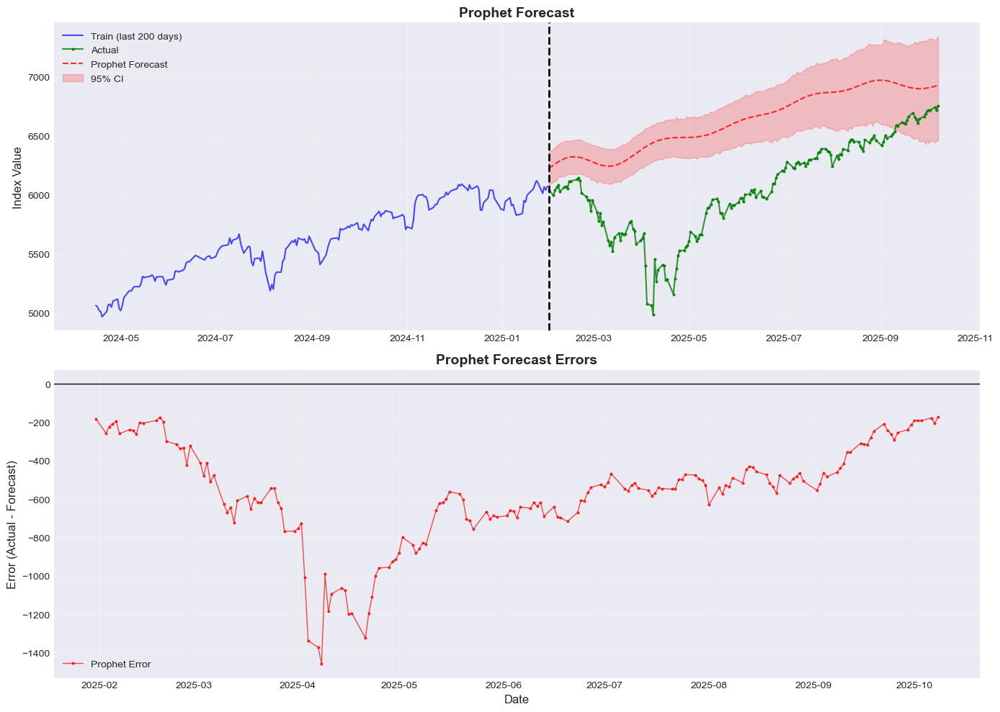


Prophet Forecast Performance:
MAE:  572.07
RMSE: 629.25

Prophet advantages:
  - Automatic changepoint detection
  - Multiple seasonalities (Fourier series)
  - Robust to missing data and outliers
  - Easy to use, scales well


In [12]:
# Visualize Prophet forecast
fig, axes = plt.subplots(2, 1, figsize=(14, 10))

# Plot 1: Full forecast
axes[0].plot(train.index[-200:], train['price'][-200:], linewidth=1.5, alpha=0.7, 
            color='blue', label='Train (last 200 days)')
# Align test data with forecast_test index for plotting
aligned_test_plot = test.reindex(forecast_test.index).dropna()
axes[0].plot(aligned_test_plot.index, aligned_test_plot['price'], linewidth=1.5, alpha=0.8, 
            color='green', label='Actual', marker='o', markersize=2)
axes[0].plot(forecast_test.index, forecast_test['yhat'], linewidth=1.5, alpha=0.8, 
            color='red', linestyle='--', label='Prophet Forecast')
axes[0].fill_between(forecast_test.index, 
                 forecast_test['yhat_lower'], 
                 forecast_test['yhat_upper'], 
                 alpha=0.2, color='red', label='95% CI')
axes[0].axvline(x=split_date, color='black', linestyle='--', linewidth=2)
axes[0].set_title('Prophet Forecast', fontsize=14, fontweight='bold')
axes[0].set_ylabel('Index Value', fontsize=12)
axes[0].legend()
axes[0].grid(True, alpha=0.3)

# Plot 2: Forecast errors
# Ensure indices are aligned
aligned_test = test.reindex(forecast_test.index).dropna()
prophet_errors = aligned_test['price'].values - forecast_test['yhat'].values
axes[1].plot(forecast_test.index, prophet_errors, linewidth=1, alpha=0.7, 
            color='red', label='Prophet Error', marker='o', markersize=2)
axes[1].axhline(y=0, color='black', linestyle='-', linewidth=1)
axes[1].set_title('Prophet Forecast Errors', fontsize=14, fontweight='bold')
axes[1].set_xlabel('Date', fontsize=12)
axes[1].set_ylabel('Error (Actual - Forecast)', fontsize=12)
axes[1].legend()
axes[1].grid(True, alpha=0.3)

plt.tight_layout()
plt.show()

# Calculate metrics - ensure indices are aligned
aligned_test = test.reindex(forecast_test.index).dropna()
prophet_mae = mean_absolute_error(aligned_test['price'], forecast_test['yhat'])
prophet_rmse = np.sqrt(mean_squared_error(aligned_test['price'], forecast_test['yhat']))

print("\n" + "=" * 60)
print("Prophet Forecast Performance:")
print("=" * 60)
print(f"MAE:  {prophet_mae:.2f}")
print(f"RMSE: {prophet_rmse:.2f}")
print(f"\nProphet advantages:")
print(f"  - Automatic changepoint detection")
print(f"  - Multiple seasonalities (Fourier series)")
print(f"  - Robust to missing data and outliers")
print(f"  - Easy to use, scales well")

Fitting multiple models for ensemble...
1. Fitting ETS(A,A,N) model...
   ✓ ETS(A,A,N) fitted
2. Fitting ARIMA(2,1,2) model...


/opt/miniconda3/lib/python3.13/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/opt/miniconda3/lib/python3.13/site-packages/statsmodels/tsa/base/tsa_model.py:837: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/opt/miniconda3/lib/python3.13/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/opt/miniconda3/lib/python3.13/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, fr

   ✓ ARIMA(2,1,2) fitted
3. Using TBATS forecast (already fitted)...
   ✓ TBATS forecast ready
4. Using BSTS forecast (already fitted)...
   ✓ BSTS forecast ready
5. Using Prophet forecast (already fitted)...
   ✓ Prophet forecast ready

✓ All models fitted successfully!


/opt/miniconda3/lib/python3.13/site-packages/statsmodels/tsa/base/tsa_model.py:837: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


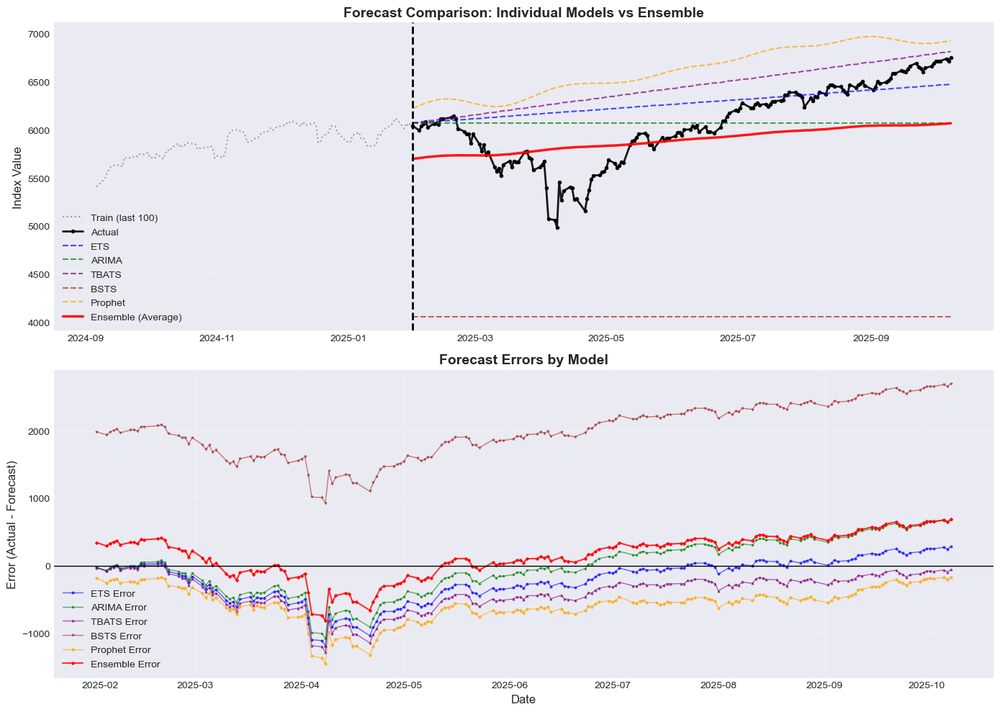


Model Comparison (Test Set Performance):
          Rank          MAE         RMSE
ETS          1   284.702245   389.777180
Ensemble     2   304.325183   359.258732
ARIMA        3   334.025002   404.320354
TBATS        4   391.280319   477.364177
Prophet      5   572.072906   629.247530
BSTS         6  1996.498007  2036.955028

Key Takeaways:
1. Ensemble (simple average) often performs as well or better than individual models
2. Combining forecasts reduces model-specific risk
3. Simple equal-weight averaging is a strong baseline
4. Weighted combinations can help, but require careful validation to avoid overfitting


In [13]:
# Fit multiple models for ensemble (if not already fitted)
print("Fitting multiple models for ensemble...")
print("=" * 60)

# 1. ETS model
print("1. Fitting ETS(A,A,N) model...")
ets_model = ExponentialSmoothing(train['price'], trend='add', seasonal=None)
ets_fitted = ets_model.fit()
ets_forecast = ets_fitted.forecast(steps=len(test))
print(f"   ✓ ETS(A,A,N) fitted")

# 2. ARIMA model
print("2. Fitting ARIMA(2,1,2) model...")
arima_model = ARIMA(train['price'], order=(2, 1, 2))
arima_fitted = arima_model.fit()
arima_forecast = arima_fitted.forecast(steps=len(test))
print(f"   ✓ ARIMA(2,1,2) fitted")

# 3. TBATS (already fitted in Part 4)
print("3. Using TBATS forecast (already fitted)...")
print(f"   ✓ TBATS forecast ready")

# 4. BSTS (already fitted in Part 5)
print("4. Using BSTS forecast (already fitted)...")
print(f"   ✓ BSTS forecast ready")

# 5. Prophet (already fitted in Part 6)
print("5. Using Prophet forecast (already fitted)...")
prophet_forecast = forecast_test['yhat'].values
print(f"   ✓ Prophet forecast ready")

print("\n✓ All models fitted successfully!")

# Create ensemble forecasts
forecasts = {}
forecasts['ETS'] = ets_forecast.values
forecasts['ARIMA'] = arima_forecast.values
forecasts['TBATS'] = tbats_forecast
forecasts['BSTS'] = bsts_forecast.values
forecasts['Prophet'] = prophet_forecast

# Ensure all forecasts have the same length (take minimum length)
min_length = min(len(forecasts['ETS']), len(forecasts['ARIMA']), 
                 len(forecasts['TBATS']), len(forecasts['BSTS']), len(forecasts['Prophet']))
for key in forecasts:
    forecasts[key] = forecasts[key][:min_length]

# Simple average ensemble (equal weights)
ensemble_forecast = (forecasts['ETS'] + forecasts['ARIMA'] + forecasts['TBATS'] + 
                     forecasts['BSTS'] + forecasts['Prophet']) / 5

# Calculate individual model metrics (use same length for test data)
test_values = test['price'].values[:min_length]

metrics = {}
for name, forecast in forecasts.items():
    mae = mean_absolute_error(test_values, forecast)
    rmse = np.sqrt(mean_squared_error(test_values, forecast))
    metrics[name] = {'MAE': mae, 'RMSE': rmse}

# Calculate ensemble metrics
ensemble_mae = mean_absolute_error(test_values, ensemble_forecast)
ensemble_rmse = np.sqrt(mean_squared_error(test_values, ensemble_forecast))
metrics['Ensemble'] = {'MAE': ensemble_mae, 'RMSE': ensemble_rmse}

# Visualize forecasts (use aligned indices)
test_index_aligned = test.index[:min_length]

fig, axes = plt.subplots(2, 1, figsize=(14, 10))

# Plot 1: All forecasts
axes[0].plot(train.index[-100:], train['price'][-100:], linewidth=1.5, alpha=0.7, 
            color='gray', label='Train (last 100)', linestyle=':')
axes[0].plot(test_index_aligned, test_values, linewidth=2, alpha=0.9, 
            color='black', label='Actual', marker='o', markersize=3)
axes[0].plot(test_index_aligned, forecasts['ETS'], linewidth=1.5, alpha=0.7, 
            color='blue', linestyle='--', label='ETS')
axes[0].plot(test_index_aligned, forecasts['ARIMA'], linewidth=1.5, alpha=0.7, 
            color='green', linestyle='--', label='ARIMA')
axes[0].plot(test_index_aligned, forecasts['TBATS'], linewidth=1.5, alpha=0.7, 
            color='purple', linestyle='--', label='TBATS')
axes[0].plot(test_index_aligned, forecasts['BSTS'], linewidth=1.5, alpha=0.7, 
            color='brown', linestyle='--', label='BSTS')
axes[0].plot(test_index_aligned, forecasts['Prophet'], linewidth=1.5, alpha=0.7, 
            color='orange', linestyle='--', label='Prophet')
axes[0].plot(test_index_aligned, ensemble_forecast, linewidth=2.5, alpha=0.9, 
            color='red', linestyle='-', label='Ensemble (Average)')
axes[0].axvline(x=split_date, color='black', linestyle='--', linewidth=2)
axes[0].set_title('Forecast Comparison: Individual Models vs Ensemble', fontsize=14, fontweight='bold')
axes[0].set_ylabel('Index Value', fontsize=12)
axes[0].legend(loc='best')
axes[0].grid(True, alpha=0.3)

# Plot 2: Forecast errors
axes[1].plot(test_index_aligned, test_values - forecasts['ETS'], linewidth=1, alpha=0.6, 
            color='blue', label='ETS Error', marker='o', markersize=2)
axes[1].plot(test_index_aligned, test_values - forecasts['ARIMA'], linewidth=1, alpha=0.6, 
            color='green', label='ARIMA Error', marker='s', markersize=2)
axes[1].plot(test_index_aligned, test_values - forecasts['TBATS'], linewidth=1, alpha=0.6, 
            color='purple', label='TBATS Error', marker='^', markersize=2)
axes[1].plot(test_index_aligned, test_values - forecasts['BSTS'], linewidth=1, alpha=0.6, 
            color='brown', label='BSTS Error', marker='v', markersize=2)
axes[1].plot(test_index_aligned, test_values - forecasts['Prophet'], linewidth=1, alpha=0.6, 
            color='orange', label='Prophet Error', marker='D', markersize=2)
axes[1].plot(test_index_aligned, test_values - ensemble_forecast, linewidth=1.5, alpha=0.8, 
            color='red', label='Ensemble Error', marker='D', markersize=2)
axes[1].axhline(y=0, color='black', linestyle='-', linewidth=1)
axes[1].set_title('Forecast Errors by Model', fontsize=14, fontweight='bold')
axes[1].set_xlabel('Date', fontsize=12)
axes[1].set_ylabel('Error (Actual - Forecast)', fontsize=12)
axes[1].legend()
axes[1].grid(True, alpha=0.3)

plt.tight_layout()
plt.show()

# Print comparison table
print("\n" + "=" * 60)
print("Model Comparison (Test Set Performance):")
print("=" * 60)
comparison_df = pd.DataFrame(metrics).T
comparison_df = comparison_df.sort_values('MAE')
comparison_df['Rank'] = range(1, len(comparison_df) + 1)
comparison_df = comparison_df[['Rank', 'MAE', 'RMSE']]
print(comparison_df.to_string())

print("\n" + "=" * 60)
print("Key Takeaways:")
print("=" * 60)
print("1. Ensemble (simple average) often performs as well or better than individual models")
print("2. Combining forecasts reduces model-specific risk")
print("3. Simple equal-weight averaging is a strong baseline")
print("4. Weighted combinations can help, but require careful validation to avoid overfitting")

## Part 8: Comprehensive Model Comparison

Let's compare all models we've introduced:
- ETS (Exponential Smoothing)
- ARIMA
- TBATS
- BSTS
- Prophet
- Ensemble (Simple Average)

We'll evaluate them using MAPE (Mean Absolute Percentage Error) at different forecast horizons:
- 1 week ahead (7 days)
- 1 month ahead (30 days)
- 1 year ahead (full test period)

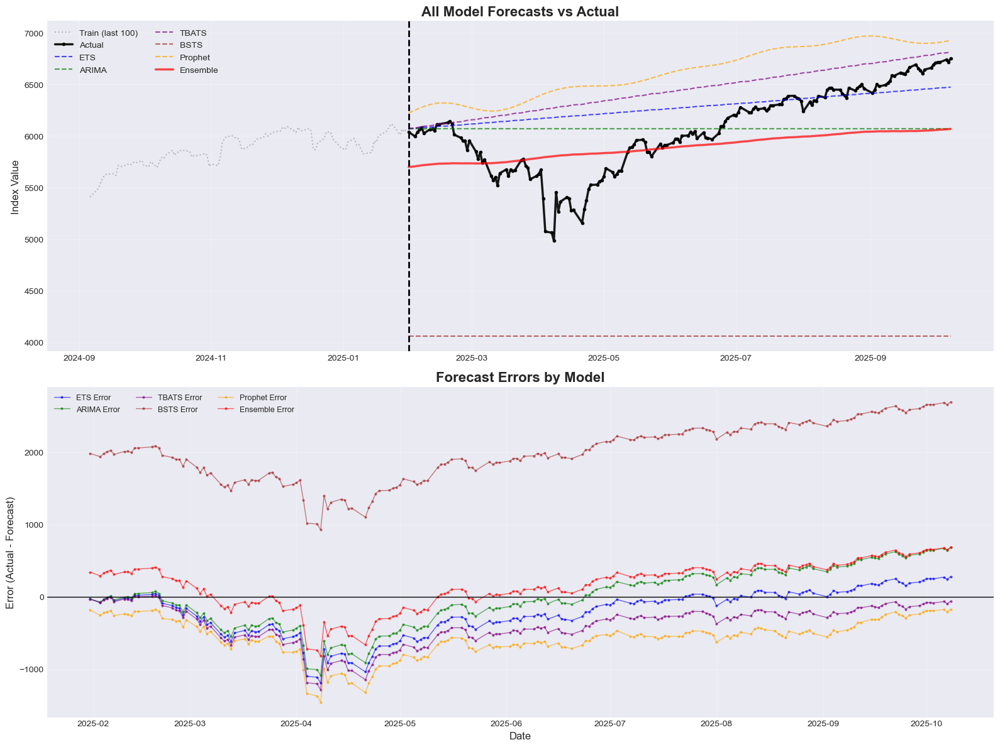

In [14]:
# Collect all forecasts (ensure same length)
all_forecasts = {
    'ETS': ets_forecast.values[:min_length],
    'ARIMA': arima_forecast.values[:min_length],
    'TBATS': tbats_forecast[:min_length],
    'BSTS': bsts_forecast.values[:min_length],
    'Prophet': prophet_forecast[:min_length],
    'Ensemble': ensemble_forecast[:min_length]
}

# Actual values (aligned)
actual_values = test_values[:min_length]
actual_index = test_index_aligned[:min_length]

# Visualize all forecasts together
fig, axes = plt.subplots(2, 1, figsize=(16, 12))

# Plot 1: All forecasts vs actual
axes[0].plot(train.index[-100:], train['price'][-100:], linewidth=1.5, alpha=0.5, 
            color='gray', label='Train (last 100)', linestyle=':')
axes[0].plot(actual_index, actual_values, linewidth=2.5, alpha=0.9, 
            color='black', label='Actual', marker='o', markersize=3)

# Plot each model forecast
colors = {'ETS': 'blue', 'ARIMA': 'green', 'TBATS': 'purple', 
          'BSTS': 'brown', 'Prophet': 'orange', 'Ensemble': 'red'}
linestyles = {'ETS': '--', 'ARIMA': '--', 'TBATS': '--', 
              'BSTS': '--', 'Prophet': '--', 'Ensemble': '-'}
linewidths = {'ETS': 1.5, 'ARIMA': 1.5, 'TBATS': 1.5, 
              'BSTS': 1.5, 'Prophet': 1.5, 'Ensemble': 2.5}

for model_name, forecast in all_forecasts.items():
    axes[0].plot(actual_index, forecast, linewidth=linewidths[model_name], 
                alpha=0.7, color=colors[model_name], linestyle=linestyles[model_name], 
                label=model_name)

axes[0].axvline(x=split_date, color='black', linestyle='--', linewidth=2)
axes[0].set_title('All Model Forecasts vs Actual', fontsize=16, fontweight='bold')
axes[0].set_ylabel('Index Value', fontsize=12)
axes[0].legend(loc='best', ncol=2, fontsize=10)
axes[0].grid(True, alpha=0.3)

# Plot 2: Forecast errors for all models
for model_name, forecast in all_forecasts.items():
    errors = actual_values - forecast
    axes[1].plot(actual_index, errors, linewidth=1, alpha=0.6, 
                color=colors[model_name], label=f'{model_name} Error', 
                marker='o', markersize=2)

axes[1].axhline(y=0, color='black', linestyle='-', linewidth=1)
axes[1].set_title('Forecast Errors by Model', fontsize=16, fontweight='bold')
axes[1].set_xlabel('Date', fontsize=12)
axes[1].set_ylabel('Error (Actual - Forecast)', fontsize=12)
axes[1].legend(loc='best', ncol=3, fontsize=9)
axes[1].grid(True, alpha=0.3)

plt.tight_layout()
plt.show()

In [15]:
# Calculate MAPE for different forecast horizons
def calculate_mape(actual, forecast):
    """Calculate Mean Absolute Percentage Error"""
    return np.mean(np.abs((actual - forecast) / actual)) * 100

# Define horizons (in days)
# Test period is exactly 1 year (from 2025-01-31 to 2026-01-30)
horizons = {
    '1 Week': 7,
    '1 Month': 30,
    '1 Year': len(actual_values)  # Full test period (1 year)
}

# Calculate MAPE for each model at each horizon
comparison_results = []

for model_name, forecast in all_forecasts.items():
    model_results = {'Model': model_name}
    for horizon_name, horizon_days in horizons.items():
        # Take first N days of forecast and actual
        h_actual = actual_values[:horizon_days]
        h_forecast = forecast[:horizon_days]
        mape = calculate_mape(h_actual, h_forecast)
        model_results[f'MAPE ({horizon_name})'] = mape
    comparison_results.append(model_results)

# Create comparison DataFrame
comparison_df = pd.DataFrame(comparison_results)
comparison_df = comparison_df.sort_values('MAPE (1 Year)')

# Display results
print("=" * 80)
print("Model Comparison: MAPE at Different Forecast Horizons")
print("=" * 80)
print(comparison_df.to_string(index=False))
print("\nNote: MAPE is in percentage (lower is better)")
print(f"Test period: {len(actual_values)} days")
print(f"1 Week = {horizons['1 Week']} days, 1 Month = {horizons['1 Month']} days, 1 Year = {horizons['1 Year']} days")

Model Comparison: MAPE at Different Forecast Horizons
   Model  MAPE (1 Week)  MAPE (1 Month)  MAPE (1 Year)
Ensemble       5.495235        4.071262       4.983285
     ETS       0.578035        3.334229       4.989825
   ARIMA       0.488238        2.891425       5.616540
   TBATS       0.698021        3.743617       6.770661
 Prophet       3.699021        6.080394       9.739222
    BSTS      32.878298       31.440489      32.672943

Note: MAPE is in percentage (lower is better)
Test period: 173 days
1 Week = 7 days, 1 Month = 30 days, 1 Year = 173 days
